### Laboratorium 6 - część projektowa

W tej części zajmiesz się wykorzystaniem punktów kluczowych do łączenia obrazów (_image stitching_). Celem zadania jest przetestowanie możliwości detekcji i parowania punktów kluczowych w celu łączenia obrazów. Istotne jest, by samodzielnie przejść całą ścieżkę: od detekcji punktów kluczowych i wyznaczenia ich desktryptorów, przez ich parowanie i znalezienie transformacji, po finalne połączenie obrazów. Rozwiązania oparte o gotowce w stylu black-box nie będą oceniane.

Wykonaj serię zdjęć dowolnej wybranej przez siebie **statycznej** sceny. Może to być niemal dowolny widok o dowolnej skali: panorama miasta, swojego pokoju, powierzchni biurka - ważne, by pozyskane obrazy umożliwiały (1) użycie algorytmu SIFT, oraz (2) wykonanie transformacji geometrycznej.

Wykonaj 4-5 zdjęć, spośród których pierwsze (nazwij je `base`) niech przedstawia \"główny\" widok sceny, a pozostałe (o nazwie `offset_{index}`) niech cechują się coraz większym przesunięciem kamery względem `base`. Proponowane różnice:
* nieznaczne przesunięcie (o ~połowę szerokości klatki),
* większe przesunięcie (o 3/4 szerokości lub więcej),
* przesunięcie z rotacją w osi kamery,
* (jeśli to możliwe) przybliżenie/oddalenie kamery.

Wykorzystaj algorytmy opracowane do realizacji zadania 3 (zwłaszcza 3b) w celu przekształcania obrazów `offset_x` do geometrii `base`. Upewnij się, że wymiary wynikowych obrazów są wystarczające do zmieszczenia obu składowych.

*Czy każdą parę `offset_i`-`base` udało się połączyć? Jeśli dla którejś pary metoda zawiodła, to dlaczego?*  
*Jaka była jakość dopasowania? Na jakiej podstawie ją określasz?*

In [46]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

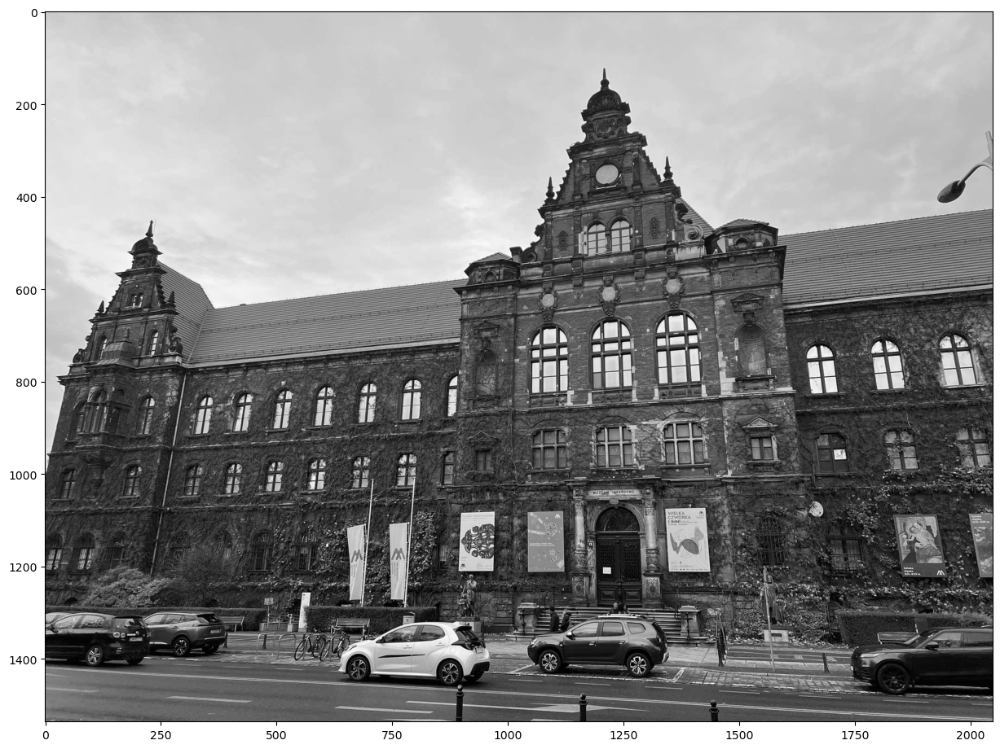

In [47]:
base = cv2.imread('base_1.jpg', cv2.IMREAD_GRAYSCALE)

offsets = [
    cv2.imread(f'offset_1_{i}.jpg', cv2.IMREAD_GRAYSCALE)
    for i in range(0, 4)
]

plt.figure(figsize=(15, 15))

plt.imshow(base, cmap='gray')

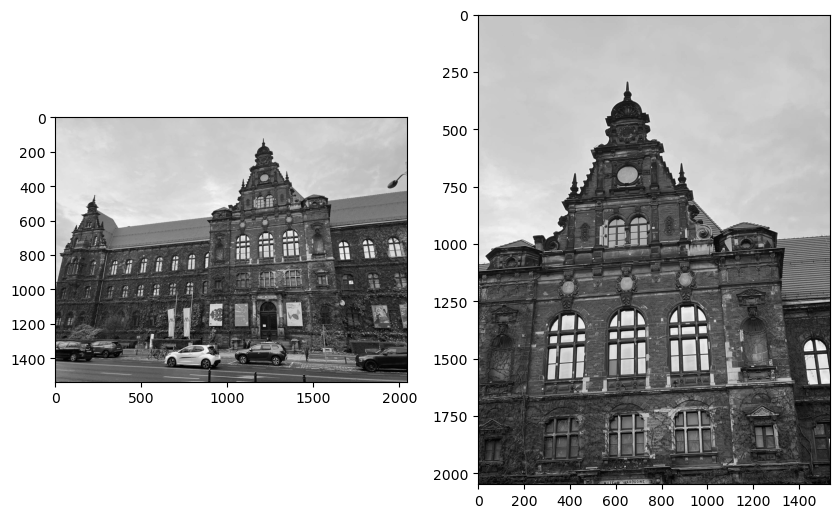

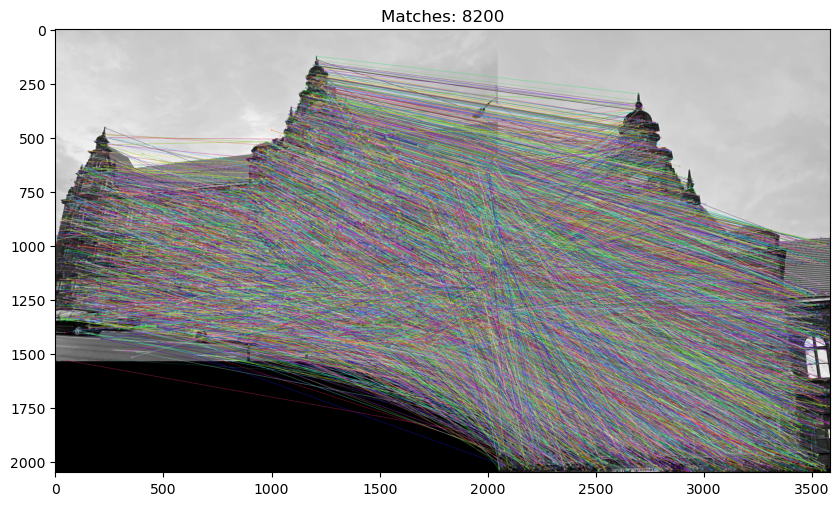

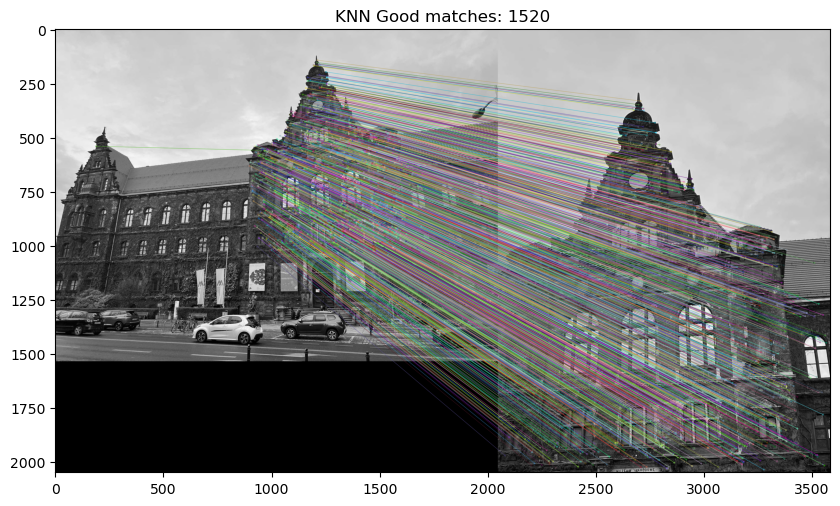

In [48]:
i = 0

f, (a1, a2) = plt.subplots(1, 2, figsize=(10, 10))
a1.imshow(base, cmap='gray')
a2.imshow(offsets[i], cmap='gray')
plt.show()

sift = cv2.SIFT_create()
k1, d1 = sift.detectAndCompute(base, None)
k2, d2 = sift.detectAndCompute(offsets[i], None)

matcher = cv2.BFMatcher_create(cv2.NORM_L2, crossCheck=True)
matches = matcher.match(d1, d2)
show = cv2.drawMatches(base, k1, offsets[i], k2, matches, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

plt.figure(figsize=(10, 10))
plt.imshow(show)
plt.title(f'Matches: {len(matches)}')
plt.show()

knn_matcher = cv2.BFMatcher_create(cv2.NORM_L2, crossCheck=False)
matches = knn_matcher.knnMatch(d1, d2, k=2)

good = []
for m, n in matches:
    if m.distance < 0.5 * n.distance:
        good.append(m)

show = cv2.drawMatches(base, k1, offsets[i], k2, good, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

plt.figure(figsize=(10, 10))
plt.imshow(show)
plt.title(f'KNN Good matches: {len(good)}')
plt.show()


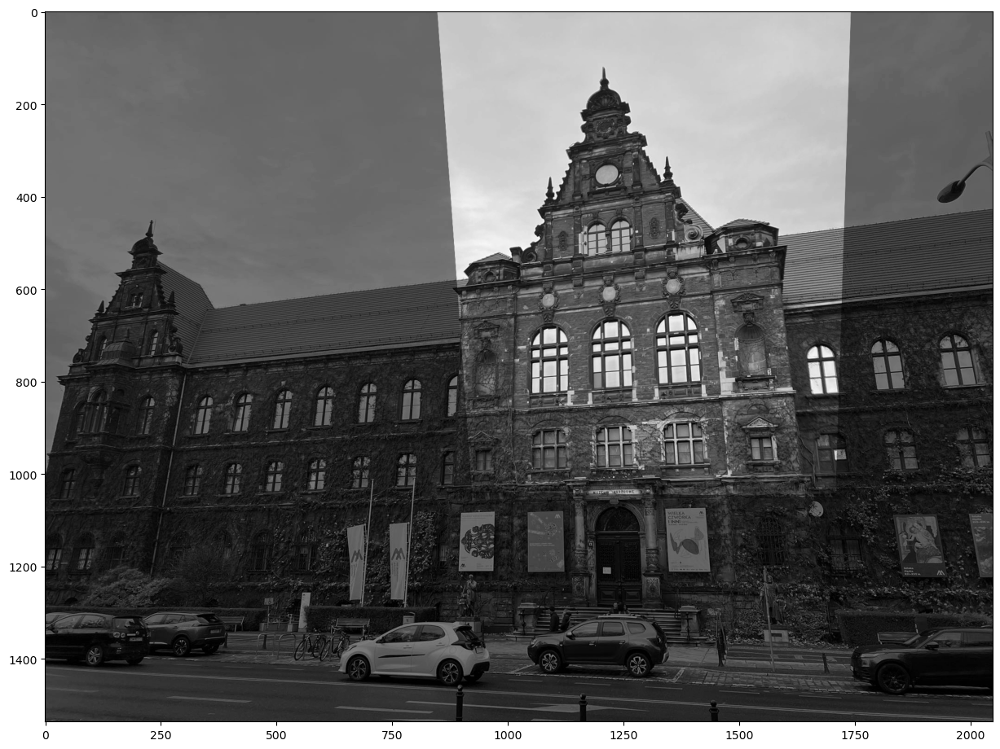

In [49]:
train = np.float32([k1[m.queryIdx].pt for m in good]).reshape(-1, 1, 2)
query = np.float32([k2[m.trainIdx].pt for m in good]).reshape(-1, 1, 2)
H, _ = cv2.findHomography(query, train, cv2.RANSAC, 5.0)

result = cv2.warpPerspective(offsets[i], H, (base.shape[1], base.shape[0]))

plt.figure(figsize=(15, 15))
plt.imshow(cv2.addWeighted(base, 0.5, result, 0.5, 0), cmap='gray')

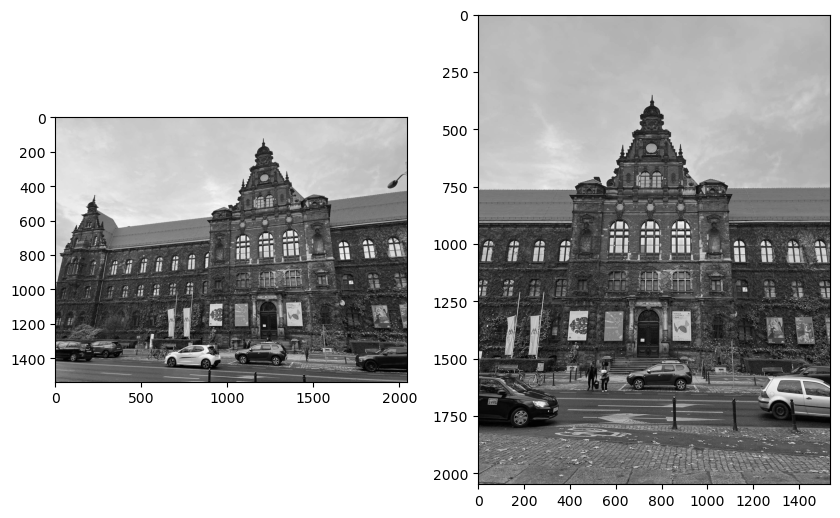

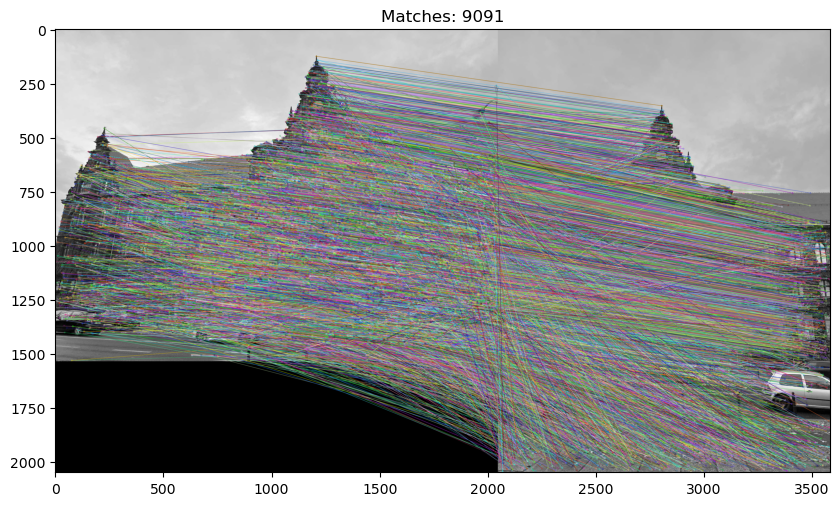

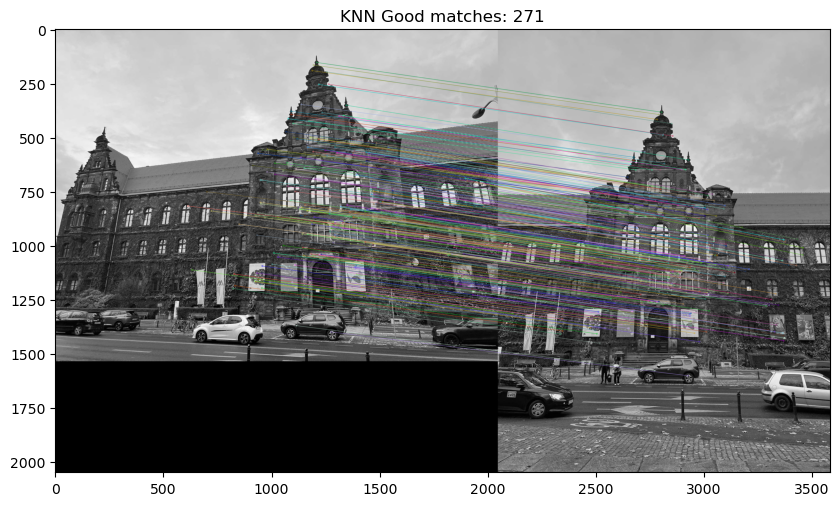

In [50]:
i = 1

f, (a1, a2) = plt.subplots(1, 2, figsize=(10, 10))
a1.imshow(base, cmap='gray')
a2.imshow(offsets[i], cmap='gray')
plt.show()

sift = cv2.SIFT_create()
k1, d1 = sift.detectAndCompute(base, None)
k2, d2 = sift.detectAndCompute(offsets[i], None)

matcher = cv2.BFMatcher_create(cv2.NORM_L2, crossCheck=True)
matches = matcher.match(d1, d2)
show = cv2.drawMatches(base, k1, offsets[i], k2, matches, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

plt.figure(figsize=(10, 10))
plt.imshow(show)
plt.title(f'Matches: {len(matches)}')
plt.show()

knn_matcher = cv2.BFMatcher_create(cv2.NORM_L2, crossCheck=False)
matches = knn_matcher.knnMatch(d1, d2, k=2)

good = []
for m, n in matches:
    if m.distance < 0.3 * n.distance:
        good.append(m)

show = cv2.drawMatches(base, k1, offsets[i], k2, good, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

plt.figure(figsize=(10, 10))
plt.imshow(show)
plt.title(f'KNN Good matches: {len(good)}')
plt.show()


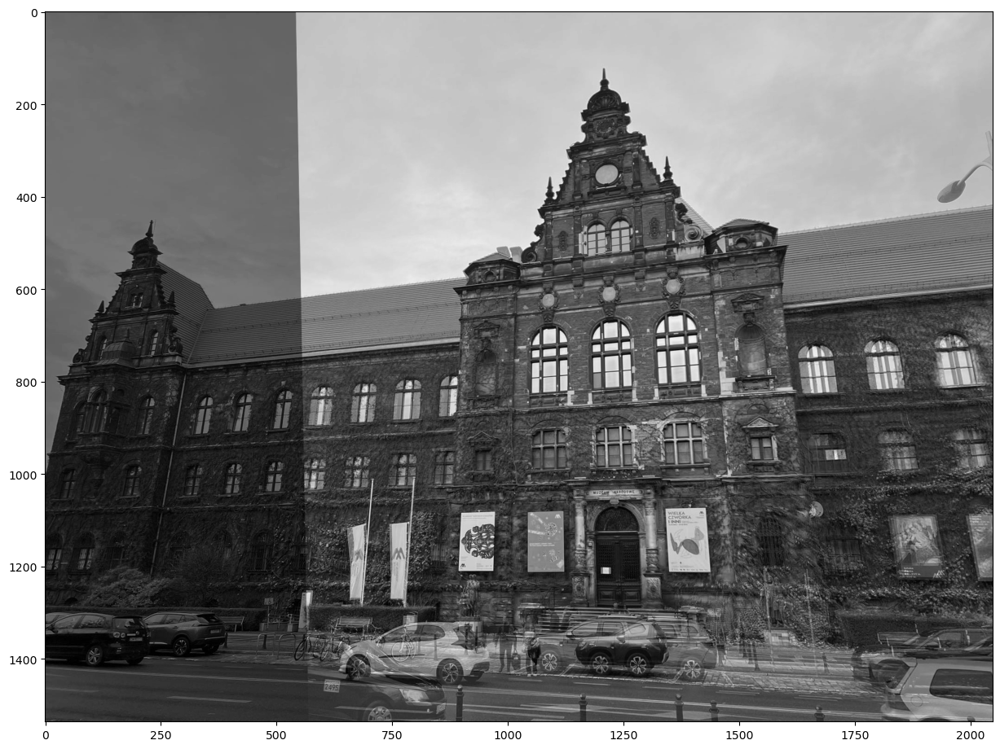

In [51]:
train = np.float32([k1[m.queryIdx].pt for m in good]).reshape(-1, 1, 2)
query = np.float32([k2[m.trainIdx].pt for m in good]).reshape(-1, 1, 2)

H, _ = cv2.findHomography(query, train, cv2.RANSAC, 5.0)

result = cv2.warpPerspective(offsets[i], H, (base.shape[1], base.shape[0]))

plt.figure(figsize=(15, 15))
plt.imshow(cv2.addWeighted(base, 0.5, result, 0.5, 0), cmap='gray')


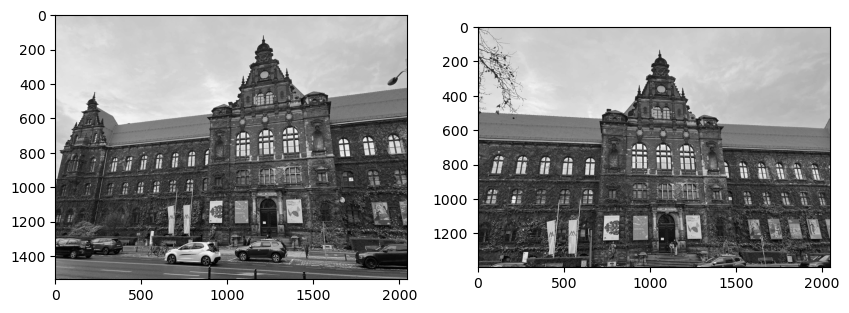

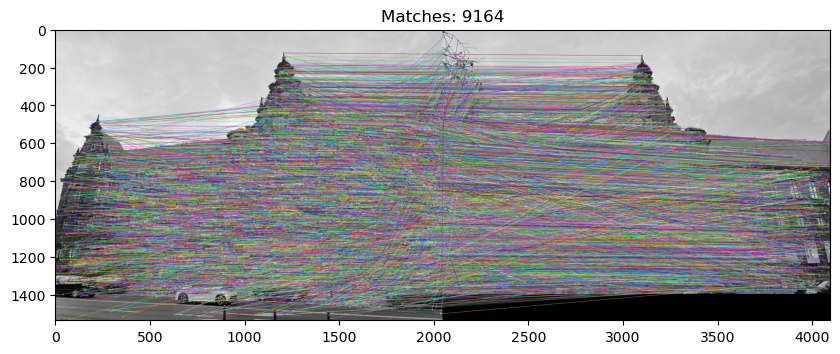

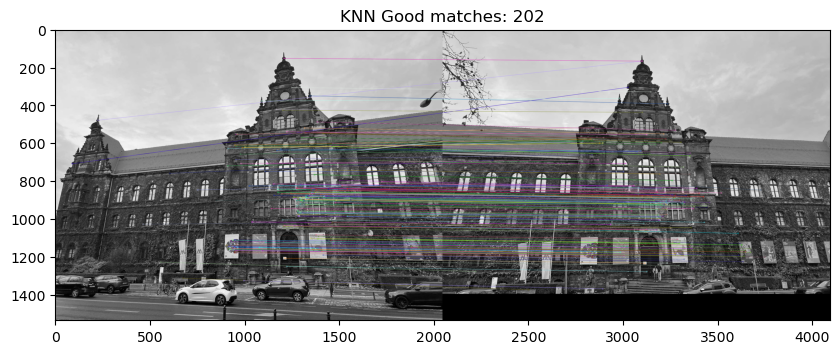

In [73]:
i = 2

f, (a1, a2) = plt.subplots(1, 2, figsize=(10, 10))
a1.imshow(base, cmap='gray')
a2.imshow(offsets[i], cmap='gray')
plt.show()

sift = cv2.SIFT_create(edgeThreshold=25)
k1, d1 = sift.detectAndCompute(base, None)
k2, d2 = sift.detectAndCompute(offsets[i], None)

matcher = cv2.BFMatcher_create(cv2.NORM_L2, crossCheck=True)
matches = matcher.match(d1, d2)
show = cv2.drawMatches(base, k1, offsets[i], k2, matches, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

plt.figure(figsize=(10, 10))
plt.imshow(show)
plt.title(f'Matches: {len(matches)}')
plt.show()

knn_matcher = cv2.BFMatcher_create(cv2.NORM_L2, crossCheck=False)
matches = knn_matcher.knnMatch(d1, d2, k=2)

good = []
for m, n in matches:
    if m.distance < 0.4 * n.distance:
        good.append(m)

show = cv2.drawMatches(base, k1, offsets[i], k2, good, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

plt.figure(figsize=(10, 10))
plt.imshow(show)
plt.title(f'KNN Good matches: {len(good)}')
plt.show()

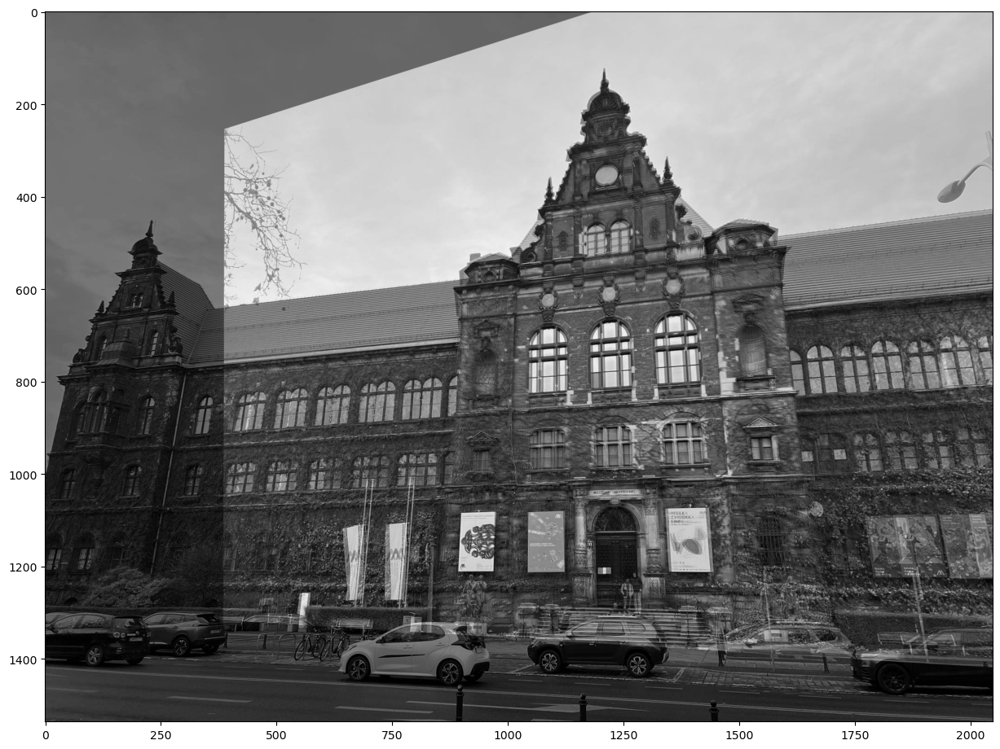

In [74]:
train = np.float32([k1[m.queryIdx].pt for m in good]).reshape(-1, 1, 2)
query = np.float32([k2[m.trainIdx].pt for m in good]).reshape(-1, 1, 2)


H, _ = cv2.findHomography(query, train, cv2.RANSAC, 5.0)

result = cv2.warpPerspective(offsets[i], H, (base.shape[1], base.shape[0]))

plt.figure(figsize=(15, 15))
plt.imshow(cv2.addWeighted(base, 0.5, result, 0.5, 0), cmap='gray')

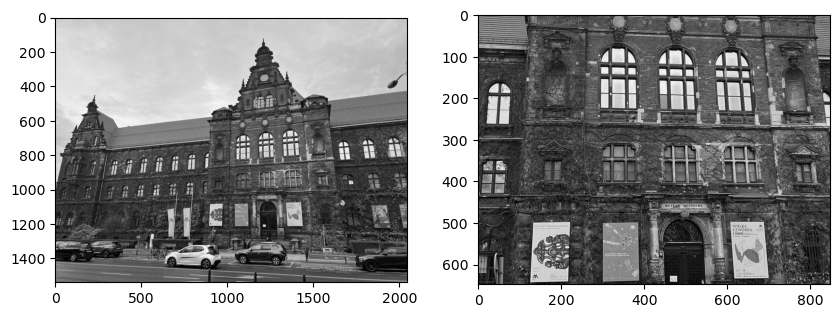

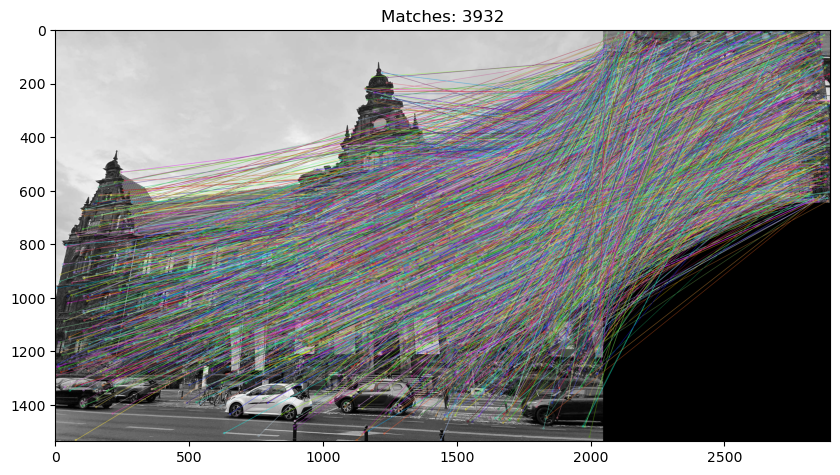

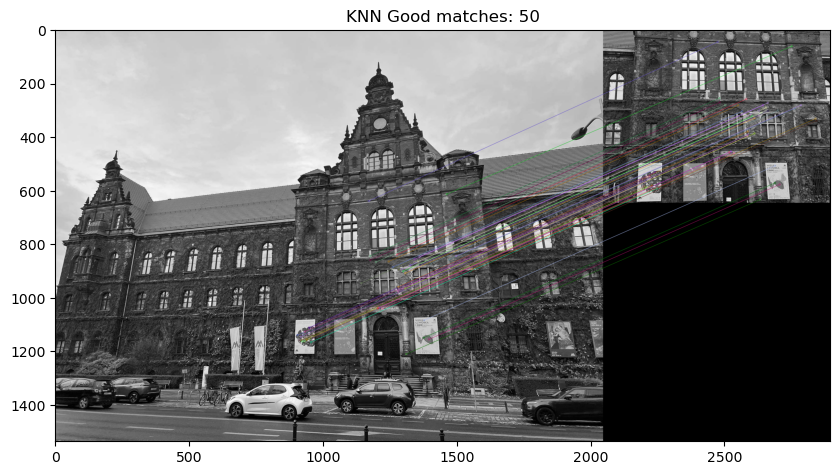

In [95]:
cropped =offsets[i]

cropped  = cropped[600:cropped.shape[0] - 150, 600:cropped.shape[1] - 600]

f, (a1, a2) = plt.subplots(1, 2, figsize=(10, 10))
a1.imshow(base, cmap='gray')
a2.imshow(cropped, cmap='gray')
plt.show()

sift = cv2.SIFT_create()
k1, d1 = sift.detectAndCompute(base, None)
k2, d2 = sift.detectAndCompute(cropped, None)

matcher = cv2.BFMatcher_create(cv2.NORM_L2, crossCheck=True)
matches = matcher.match(d1, d2)
show = cv2.drawMatches(base, k1, cropped, k2, matches, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

plt.figure(figsize=(10, 10))
plt.imshow(show)
plt.title(f'Matches: {len(matches)}')
plt.show()

knn_matcher = cv2.BFMatcher_create(cv2.NORM_L2, crossCheck=False)
matches = knn_matcher.knnMatch(d1, d2, k=2)

good = []
for m, n in matches:
    if m.distance < 0.3 * n.distance:
        good.append(m)

show = cv2.drawMatches(base, k1, cropped, k2, good, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

plt.figure(figsize=(10, 10))
plt.imshow(show)
plt.title(f'KNN Good matches: {len(good)}')
plt.show()

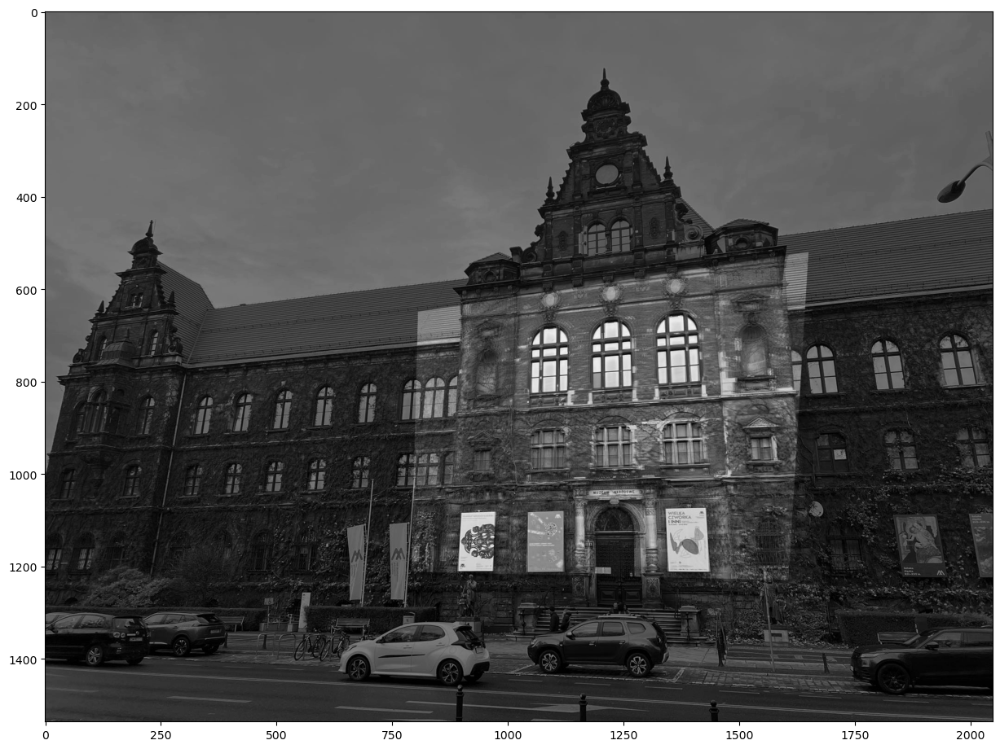

In [96]:
train = np.float32([k1[m.queryIdx].pt for m in good]).reshape(-1, 1, 2)
query = np.float32([k2[m.trainIdx].pt for m in good]).reshape(-1, 1, 2)

H, _ = cv2.findHomography(query, train, cv2.RANSAC, 5.0)

result = cv2.warpPerspective(cropped, H, (base.shape[1], base.shape[0]))

plt.figure(figsize=(15, 15))
plt.imshow(cv2.addWeighted(base, 0.5, result, 0.5, 0), cmap='gray')

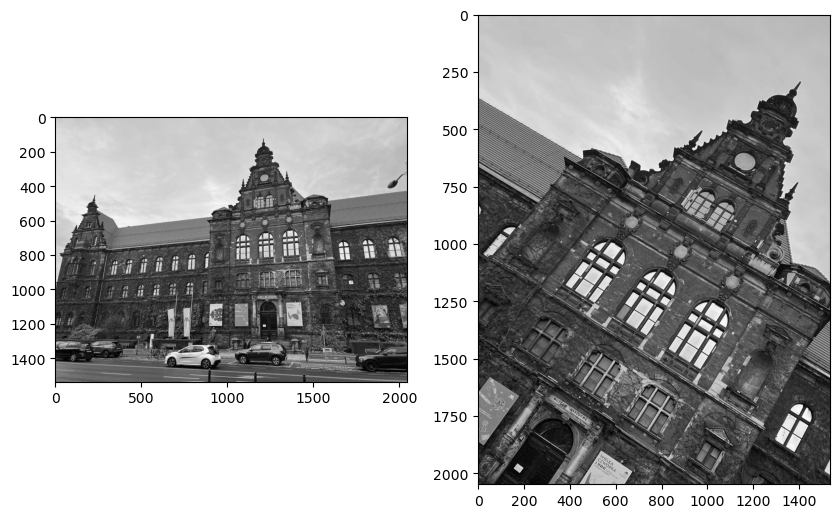

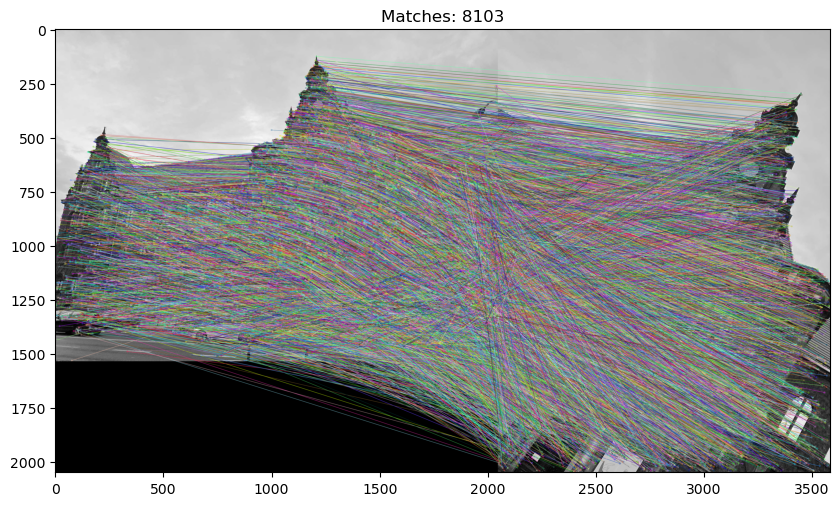

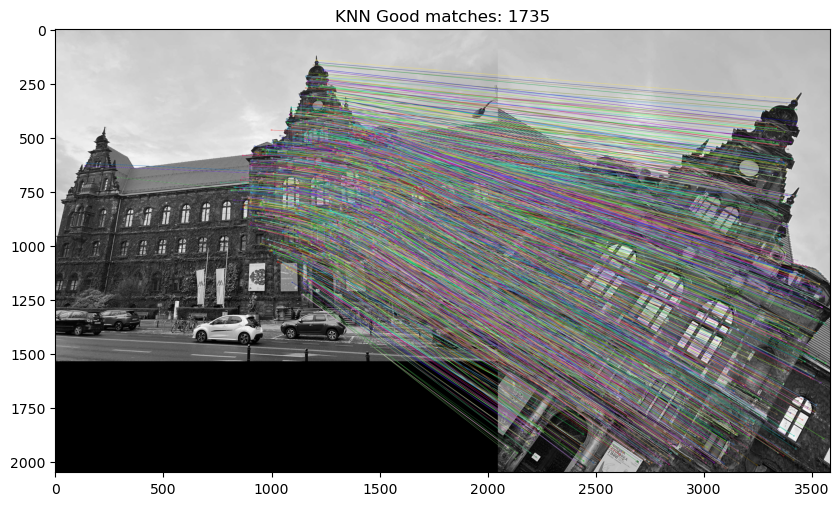

In [ ]:
i = 3

f, (a1, a2) = plt.subplots(1, 2, figsize=(10, 10))
a1.imshow(base, cmap='gray')
a2.imshow(offsets[i], cmap='gray')
plt.show()

sift = cv2.SIFT_create()
k1, d1 = sift.detectAndCompute(base, None)
k2, d2 = sift.detectAndCompute(offsets[i], None)

matcher = cv2.BFMatcher_create(cv2.NORM_L2, crossCheck=True)
matches = matcher.match(d1, d2)
show = cv2.drawMatches(base, k1, offsets[i], k2, matches, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

plt.figure(figsize=(10, 10))
plt.imshow(show)
plt.title(f'Matches: {len(matches)}')
plt.show()

knn_matcher = cv2.BFMatcher_create(cv2.NORM_L2, crossCheck=False)
matches = knn_matcher.knnMatch(d1, d2, k=2)

good = []
for m, n in matches:
    if m.distance < 0.5 * n.distance:
        good.append(m)

show = cv2.drawMatches(base, k1, offsets[i], k2, good, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

plt.figure(figsize=(10, 10))
plt.imshow(show)
plt.title(f'KNN Good matches: {len(good)}')
plt.show()

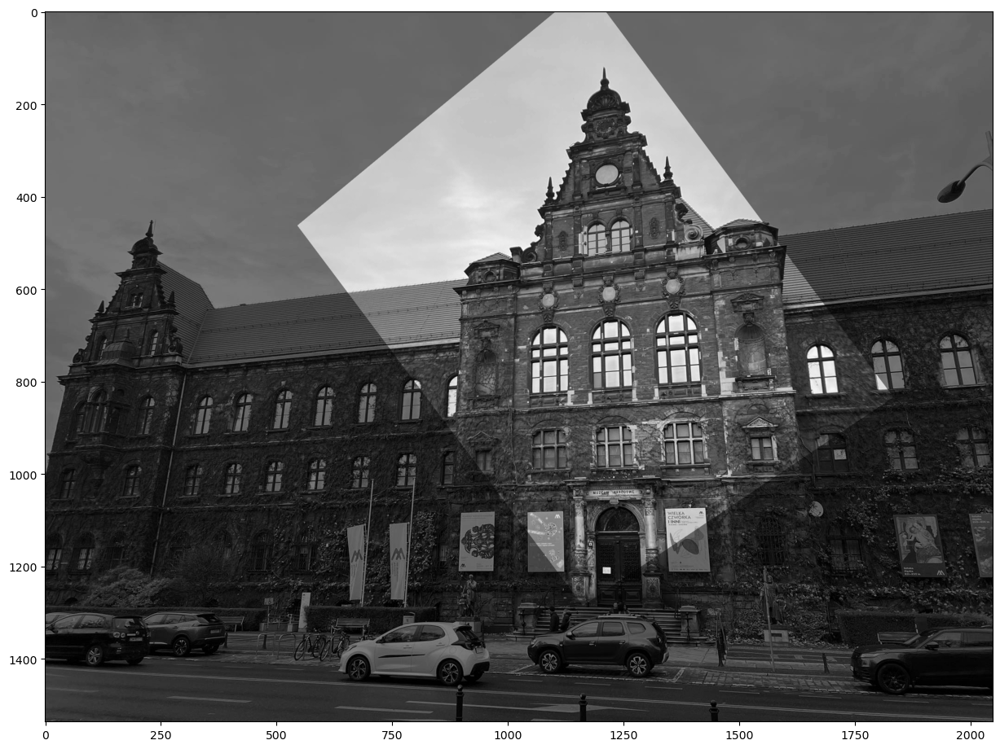

In [55]:
train = np.float32([k1[m.queryIdx].pt for m in good]).reshape(-1, 1, 2)
query = np.float32([k2[m.trainIdx].pt for m in good]).reshape(-1, 1, 2)

H, _ = cv2.findHomography(query, train, cv2.RANSAC, 5.0)

result = cv2.warpPerspective(offsets[i], H, (base.shape[1], base.shape[0]))

plt.figure(figsize=(15, 15))

plt.imshow(cv2.addWeighted(base, 0.5, result, 0.5, 0), cmap='gray')